In [50]:
%matplotlib inline
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.append('/Users/gbromley/Dropbox/code/python_utilities/')
from python_data_functions import extract_months
import statsmodels.api as sm

/Users/gbromley/anaconda/envs/paper1_research/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [3]:
data = xr.open_dataset('~gbromley/data/ghcn_75_filtered.nc')

In [4]:
data.rename({'__xarray_dataarray_variable__':'tavg'}, inplace=True)

<xarray.Dataset>
Dimensions:  (station: 269, time: 32873)
Coordinates:
  * time     (time) datetime64[ns] 1925-01-01 1925-01-02 1925-01-03 ...
  * station  (station) object 'CA003011120' 'CA003012208' 'CA003023720' ...
Data variables:
    tavg     (time, station) float64 ...

In [5]:
t_months=[4,5,6]
#temp = data['tavg']
#t2m_months = temp.sel(time=extract_months(temp['time.month'],t_months[0],t_months[-1]))

In [6]:
normal = data.sel(time=slice('1980-01-01','2010-01-01')).groupby('station').mean()

In [8]:
normal

<xarray.Dataset>
Dimensions:  (station: 269)
Coordinates:
  * station  (station) object 'CA003011120' 'CA003012208' 'CA003023720' ...
Data variables:
    tavg     (station) float64 3.464 4.437 2.853 3.648 2.869 4.571 5.401 ...

In [7]:
anom = data - normal

In [26]:
anom_test = anom.sel(time=extract_months(anom['time.month'],t_months[0],t_months[-1]))

In [27]:
anom_test = anom_test.groupby('station').apply(lambda x: x.groupby('time.year').mean(dim='time'))

In [59]:
anom_test.station.values

array(['CA003011120', 'CA003012208', 'CA003023720', 'CA003024920',
       'CA003025480', 'CA003031093', 'CA003031320', 'CA003031400',
       'CA003032800', 'CA003033240', 'CA003033880', 'CA003033890',
       'CA003034480', 'CA004011160', 'CA004012120', 'CA004012400',
       'CA004013480', 'CA004015440', 'CA004015560', 'CA004016560',
       'CA004018160', 'CA004018880', 'CA004019040', 'CA004020160',
       'CA004020560', 'CA004028040', 'CA004047240', 'CA004048520',
       'CA004056120', 'CA004057120', 'CA005010240', 'CA005010485',
       'CA005010640', 'CA005012080', 'CA005021848', 'CA005023222',
       'USC00136243', 'USC00210018', 'USC00210287', 'USC00211245',
       'USC00211263', 'USC00211891', 'USC00212142', 'USC00212768',
       'USC00212916', 'USC00213455', 'USC00214778', 'USC00214861',
       'USC00214994', 'USC00215204', 'USC00215400', 'USC00215563',
       'USC00215638', 'USC00215842', 'USC00216787', 'USC00217087',
       'USC00218323', 'USC00218579', 'USC00218907', 'USC002190

In [128]:
test = anom_test['tavg'].to_pandas()

In [21]:
test2 = test.rolling(window=365, min_periods=90).mean()

In [129]:
test = test.T


In [102]:
test['CA003011120']

year
1930    0.055064
1931   -0.918269
1932   -1.704936
1933   -2.317714
1934    1.821731
1935   -4.734380
1936   -0.829380
1937    1.025064
1938    0.518398
1939   -0.293825
1940   -0.754380
1941    0.750064
1942    0.164509
1943   -2.378825
1944    0.355064
1945   -1.470491
1946    0.905064
1947   -1.187714
1948   -4.473269
1949    1.195620
1950   -2.893269
1951   -3.179380
1952   -0.317158
1953   -1.758825
1954   -4.052714
1955   -2.893825
1956   -1.643825
1957   -0.113825
1958    0.030620
1959    1.356297
          ...   
1985    1.569509
1986    2.425064
1987    1.477842
1988    3.702842
1989   -1.902027
1990    1.552842
1991    0.151118
1992    1.822130
1993    0.914082
1994    2.075064
1995    3.498675
1996   -1.758768
1997   -1.918881
1998    2.797286
1999   -0.726047
2000    0.233398
2001    1.974378
2002   -4.884279
2003   -1.910813
2004    1.136175
2005    1.811175
2006    0.801175
2007   -0.290529
2008         NaN
2009         NaN
2010         NaN
2011         NaN
2012     

In [135]:
test2 = test.loc['1940':'2014']

In [103]:
start_array = [1930,1940,1950,1960,1970,1980]
result_array = np.empty((6,270))
for i in np.arange(0,len(start_array)):
    test = anom_test['tavg'].to_pandas()
    test = test.T
    test = test.loc[start_array[i]:'2014']
    corr_vals = np.arange(0,len(test.CA003011120))
    corr_vals = sm.add_constant(corr_vals)
    for j in np.arange(0,len(test.columns)):
        series = test[test.columns[j]]
        model = sm.OLS(series.values,corr_vals, missing='drop')
        results = model.fit()
        result_array[i,j] = results.params[1]*10
        #plt.boxplot(result_array, positions = i)

In [158]:
test_array = result_array[:,0:269]

Text(0.5,0,'Trend Start Month')

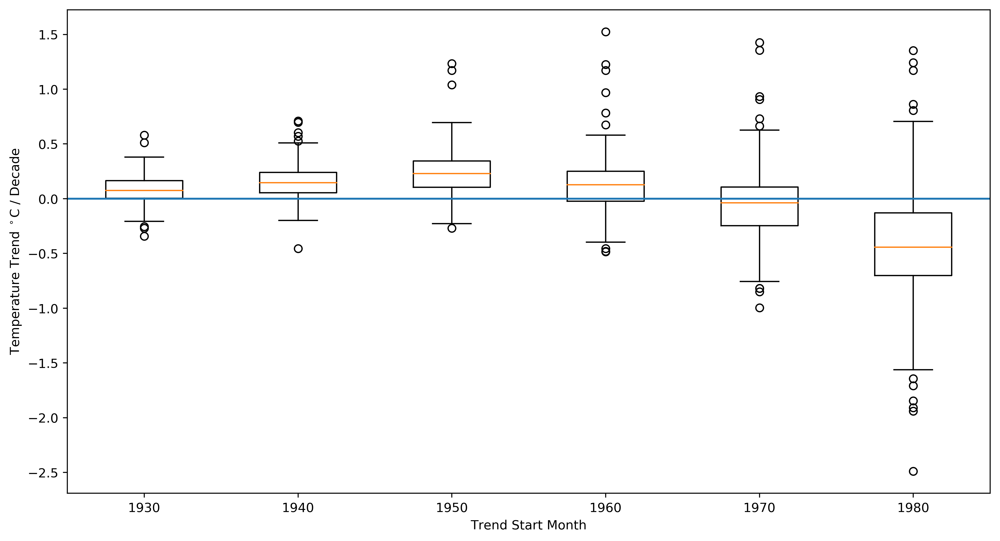

In [163]:
fig, ax = plt.subplots(ncols=1)
fig.set_dpi(400)
fig.set_size_inches((13,7))
pos = np.array(range((6)))
plt.boxplot(test_array.T, positions = pos)
plt.xticks([0,1,2,3,4,5], start_array)
ax.axhline(0)
ax.set_ylabel('Temperature Trend $^\circ$C / Decade')
ax.set_xlabel('Trend Start Month')

In [141]:
result_array[1]

array([ 3.36034353e-001,  2.95446316e-001,  3.08397080e-001,
        9.92488254e-002,  3.75287165e-002,  2.27496184e-001,
        1.50175898e-001,  2.15182337e-001,  1.11975707e-001,
        2.83046929e-001,  1.79726726e-001,  3.80161486e-001,
        2.41944463e-001,  6.03046292e-001,  5.98298506e-002,
        1.68057301e-001,  1.07003385e-001, -4.56076719e-001,
        5.58471232e-002,  3.48172930e-001,  4.35623861e-001,
        3.25004157e-001,  2.96490308e-001,  1.85053917e-001,
        2.99175179e-001,  3.27481631e-001,  1.92343393e-001,
        2.94605251e-001, -1.44943635e-002,  2.63817748e-001,
        6.97232460e-001,  2.58252642e-001,  7.24812850e-002,
        4.44846392e-001,  3.09471013e-001,  2.05638998e-001,
        8.94187291e-002,  9.88867650e-002,  8.61669882e-002,
        4.76141355e-001,  6.89537616e-002,  6.58819974e-002,
        2.94189289e-001, -1.06249232e-001, -7.07431390e-002,
        5.26046500e-001, -1.19927376e-002,  1.61980073e-001,
        6.64426570e-002,

{'boxes': [<matplotlib.lines.Line2D at 0x12c7987f0>],
 'caps': [<matplotlib.lines.Line2D at 0x12c7a1240>,
 'fliers': [<matplotlib.lines.Line2D at 0x12c7a1eb8>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x12c7a1a90>],
 'whiskers': [<matplotlib.lines.Line2D at 0x12c798940>,
  <matplotlib.lines.Line2D at 0x12c798dd8>]}

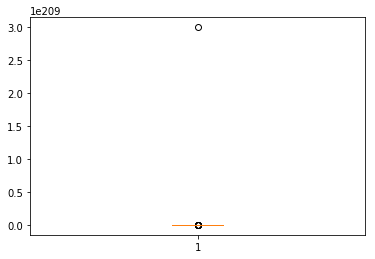

In [123]:
plt.boxplot(result_array[1])

/Users/gbromley/anaconda/envs/paper1_research/lib/python3.6/site-packages/pandas/plotting/_core.py:1716: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  series.name = label


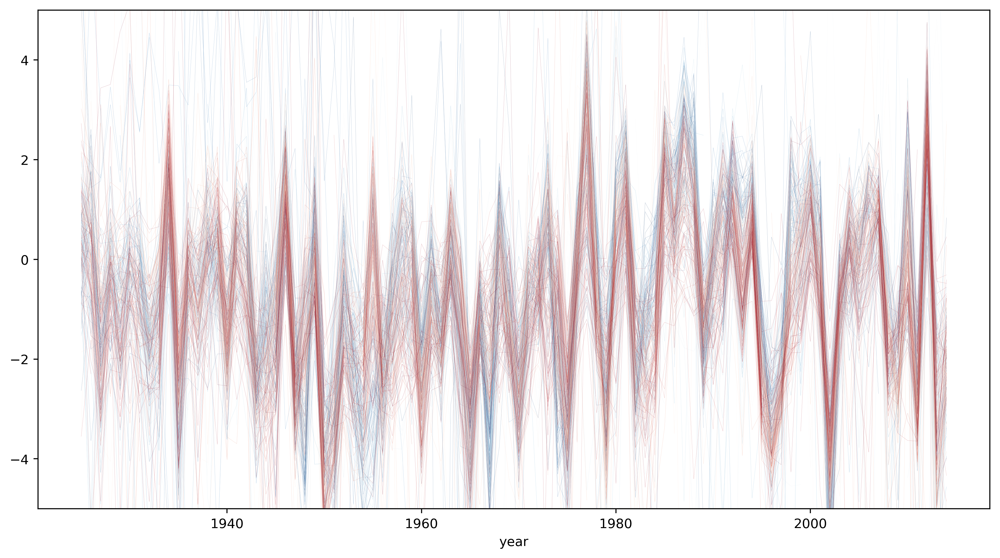

In [17]:
fig = plt.figure(1,figsize=(13,7), dpi=400.0)
ax1 = plt.subplot(111)
test.plot(x=test.index, y=test.columns, legend = False, ax=ax1, colormap = 'RdBu_r',linewidth= 0.1, alpha=0.5,ylim=(-5,5))







In [ ]:
#gammas = sn.load_dataset("gammas")
sn.tsplot(time="time", ="station",data=test)
#gammas

In [ ]:
test.plot(stacked = True)

In [ ]:
anom['tavg'].plot.line(x='time')

In [ ]:
fig = plt.figure(1,figsize=(13,7), dpi=400.0)
ax1 = plt.subplot(1,1)
plt.plot()